First I downloaded the dataset from Kaggle
and this is link of dataset {https://www.kaggle.com/datasets/kunwarakash/chennai-housing-sales-price}

Simple linear regression has just one feature and one target but Multiple linear regression has multiple features and one target also

Every feature can change the price of the house, such as the age of the house when increases the age decreases, the price of the house, and the features of the house, such as the garden and the nearby centers it

import important libraries

In [271]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
%matplotlib inline

In [272]:
# read csv file and save it in home_price
home_price = pd.read_csv('Chennai houseing sale.csv')

In [273]:
# check head
home_price.head()

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,...,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
0,P03210,Karapakkam,1004,4/5/2011,131,1.0,1.0,3,AbNormal,Yes,...,AllPub,Paved,A,4.0,3.9,4.9,4.330,380000,144400,7600000
1,P09411,Anna Nagar,1986,19-12-2006,26,2.0,1.0,5,AbNormal,No,...,AllPub,Gravel,RH,4.9,4.2,2.5,3.765,760122,304049,21717770
2,P01812,Adyar,909,4/2/2012,70,1.0,1.0,3,AbNormal,Yes,...,ELO,Gravel,RL,4.1,3.8,2.2,3.090,421094,92114,13159200
3,P05346,Velachery,1855,13-03-2010,14,3.0,2.0,5,Family,No,...,NoSewr,Paved,I,4.7,3.9,3.6,4.010,356321,77042,9630290
4,P06210,Karapakkam,1226,5/10/2009,84,1.0,1.0,3,AbNormal,Yes,...,AllPub,Gravel,C,3.0,2.5,4.1,3.290,237000,74063,7406250


In [274]:
# get more information about dataset
home_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7109 entries, 0 to 7108
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PRT_ID         7109 non-null   object 
 1   AREA           7109 non-null   object 
 2   INT_SQFT       7109 non-null   int64  
 3   DATE_SALE      7109 non-null   object 
 4   DIST_MAINROAD  7109 non-null   int64  
 5   N_BEDROOM      7108 non-null   float64
 6   N_BATHROOM     7104 non-null   float64
 7   N_ROOM         7109 non-null   int64  
 8   SALE_COND      7109 non-null   object 
 9   PARK_FACIL     7109 non-null   object 
 10  DATE_BUILD     7109 non-null   object 
 11  BUILDTYPE      7109 non-null   object 
 12  UTILITY_AVAIL  7109 non-null   object 
 13  STREET         7109 non-null   object 
 14  MZZONE         7109 non-null   object 
 15  QS_ROOMS       7109 non-null   float64
 16  QS_BATHROOM    7109 non-null   float64
 17  QS_BEDROOM     7109 non-null   float64
 18  QS_OVERA

In [275]:
# find year form two columns DATE_BUILD and DATE_SALE
def find_age():

        home_age = []
        for i in range(len(home_price['DATE_BUILD'])):

                if '-' in home_price.loc[i,'DATE_BUILD']:
                        dt = home_price.loc[i,'DATE_BUILD'].split('-')[2]
                elif '/' in home_price.loc[i,'DATE_BUILD']:
                        dt = home_price.loc[i,'DATE_BUILD'].split('/')[2]
                
                if '-' in home_price.loc[i,'DATE_SALE']:
                        ds = home_price.loc[i,'DATE_SALE'].split('-')[2]
                elif '/' in home_price.loc[i,'DATE_SALE']:
                        ds = home_price.loc[i,'DATE_SALE'].split('/')[2]

                home_age.append(int(ds) - int(dt))

        return home_age
        

In [276]:
# add new column
home_price['home_age'] = find_age()

In [277]:
home_price.head()

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,...,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE,home_age
0,P03210,Karapakkam,1004,4/5/2011,131,1.0,1.0,3,AbNormal,Yes,...,Paved,A,4.0,3.9,4.9,4.330,380000,144400,7600000,44
1,P09411,Anna Nagar,1986,19-12-2006,26,2.0,1.0,5,AbNormal,No,...,Gravel,RH,4.9,4.2,2.5,3.765,760122,304049,21717770,11
2,P01812,Adyar,909,4/2/2012,70,1.0,1.0,3,AbNormal,Yes,...,Gravel,RL,4.1,3.8,2.2,3.090,421094,92114,13159200,20
3,P05346,Velachery,1855,13-03-2010,14,3.0,2.0,5,Family,No,...,Paved,I,4.7,3.9,3.6,4.010,356321,77042,9630290,22
4,P06210,Karapakkam,1226,5/10/2009,84,1.0,1.0,3,AbNormal,Yes,...,Gravel,C,3.0,2.5,4.1,3.290,237000,74063,7406250,30


## Data cleaning and processing

In [278]:
home_price['PARK_FACIL'].value_counts()

PARK_FACIL
Yes    3587
No     3520
Noo       2
Name: count, dtype: int64

In [279]:
# change value of PARK_FACIL to number
home_price['PARK_FACIL'] = ['No' if x == 'Noo' else x for x in home_price['PARK_FACIL']]

## Check the values ​​and edit the mistakes

In [280]:
home_price['STREET'].value_counts()

STREET
Paved        2560
Gravel       2520
No Access    2010
Pavd           12
NoAccess        7
Name: count, dtype: int64

In [281]:
home_price['STREET'] = home_price['STREET'].apply(lambda x: x.replace('Pavd','Paved'))
home_price['STREET'] = home_price['STREET'].apply(lambda x: x.replace('NoAccess','No Access'))

In [282]:
home_price['STREET'].value_counts()

STREET
Paved        2572
Gravel       2520
No Access    2017
Name: count, dtype: int64

In [283]:
home_price['SALE_COND'].value_counts()

SALE_COND
AdjLand        1433
Partial        1429
Normal Sale    1423
AbNormal       1406
Family         1403
Adj Land          6
Ab Normal         5
Partiall          3
PartiaLl          1
Name: count, dtype: int64

In [284]:
home_price['SALE_COND'] = home_price['SALE_COND'].apply(lambda x: x.replace('Adj Land','AdjLand'))
home_price['SALE_COND'] = home_price['SALE_COND'].apply(lambda x: x.replace('Ab Normal','AbNormal'))
home_price['SALE_COND'] = home_price['SALE_COND'].apply(lambda x: x.replace('Partiall','Partial'))
home_price['SALE_COND'] = home_price['SALE_COND'].apply(lambda x: x.replace('PartiaLl','Partial'))

In [285]:
home_price['SALE_COND'].value_counts()

SALE_COND
AdjLand        1439
Partial        1433
Normal Sale    1423
AbNormal       1411
Family         1403
Name: count, dtype: int64

In [286]:
home_price['AREA'].value_counts()

AREA
Chrompet      1681
Karapakkam    1363
KK Nagar       996
Velachery      979
Anna Nagar     783
Adyar          773
T Nagar        496
Chrompt          9
Chrmpet          6
Chormpet         6
TNagar           5
Karapakam        3
Ana Nagar        3
Velchery         2
Ann Nagar        2
Adyr             1
KKNagar          1
Name: count, dtype: int64

In [287]:
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Chrompt','Chrompet'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Chrmpet','Chrompet'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Chormpet','Chrompet'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Karapakam','Karapakkam'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('KKNagar','KK Nagar'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Velchery','Velachery'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Ana Nagar','Anna Nagar'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Ann Nagar','Anna Nagar'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('Adyr','Adyar'))
home_price['AREA'] = home_price['AREA'].apply(lambda x: x.replace('TNagar','T Nagar'))

In [288]:
home_price['AREA'].value_counts()

AREA
Chrompet      1702
Karapakkam    1366
KK Nagar       997
Velachery      981
Anna Nagar     788
Adyar          774
T Nagar        501
Name: count, dtype: int64

In [289]:
home_price['BUILDTYPE'].value_counts()

BUILDTYPE
House         2444
Others        2336
Commercial    2325
Comercial        4
Name: count, dtype: int64

In [290]:
home_price['BUILDTYPE'] = home_price['BUILDTYPE'].apply(lambda x: x.replace('Comercial','Commercial'))

In [291]:
home_price['BUILDTYPE'].value_counts()

BUILDTYPE
House         2444
Others        2336
Commercial    2329
Name: count, dtype: int64

In [292]:
home_price['UTILITY_AVAIL'].value_counts()

UTILITY_AVAIL
AllPub     1886
NoSeWa     1871
NoSewr     1829
ELO        1522
All Pub       1
Name: count, dtype: int64

In [293]:
home_price['UTILITY_AVAIL'] = home_price['UTILITY_AVAIL'].apply(lambda x: x.replace('All Pub','AllPub'))
home_price['UTILITY_AVAIL'] = home_price['UTILITY_AVAIL'].apply(lambda x: x.replace('NoSewr','NoSeWa'))

In [294]:
home_price['UTILITY_AVAIL'].value_counts()

UTILITY_AVAIL
AllPub     1887
NoSeWa     1871
NoSeWa     1829
ELO        1522
Name: count, dtype: int64

In [295]:
home_price.loc[3,'UTILITY_AVAIL']

'NoSeWa '

In [296]:
home_price['UTILITY_AVAIL'] = home_price['UTILITY_AVAIL'].apply(lambda x: x.replace('NoSeWa ','NoSeWa'))

In [297]:
home_price['UTILITY_AVAIL'].value_counts()

UTILITY_AVAIL
NoSeWa    3700
AllPub    1887
ELO       1522
Name: count, dtype: int64

## find tha  and edit it

<Axes: >

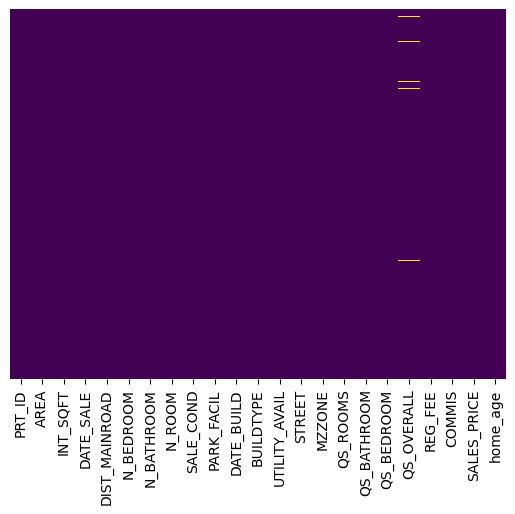

In [298]:
sns.heatmap(home_price.isnull(), yticklabels=False,cbar=False,cmap='viridis')

In [299]:
home_price['QS_OVERALL'] = home_price['QS_OVERALL'].fillna(np.mean(home_price['QS_OVERALL']))

In [300]:
home_price['N_BEDROOM'].value_counts()

N_BEDROOM
1.0    3795
2.0    2352
3.0     707
4.0     254
Name: count, dtype: int64

In [301]:
# there is one missing row
home_price['N_BEDROOM'].fillna(1, inplace=True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_2020\652395138.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  home_price['N_BEDROOM'].fillna(1, inplace=True)


In [302]:
home_price['N_BATHROOM'].value_counts()

N_BATHROOM
1.0    5589
2.0    1515
Name: count, dtype: int64

In [303]:
# there is five missing row
home_price['N_BATHROOM'].fillna(1, inplace=True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_2020\3878018895.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  home_price['N_BATHROOM'].fillna(1, inplace=True)


In [304]:
home_price['N_ROOM'].value_counts()

N_ROOM
4    2563
3    2125
5    1246
2     921
6     254
Name: count, dtype: int64

In [305]:
# there is five missing row
home_price['N_BATHROOM'].fillna(4, inplace=True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_2020\4127905075.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  home_price['N_BATHROOM'].fillna(4, inplace=True)


<Axes: >

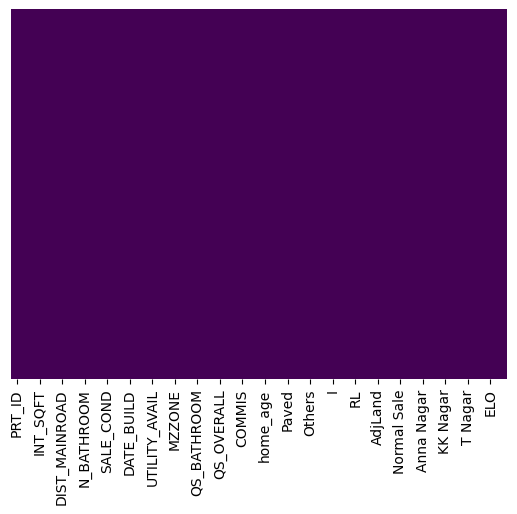

In [350]:
sns.heatmap(home_price.isnull(), yticklabels=False,cbar=False,cmap='viridis')

In [349]:
# edit type of columns
home_price = home_price.astype({'N_BEDROOM':'int64', 'N_BATHROOM':'int64', 'SALES_PRICE':'float64'}, copy=False)

In [307]:
home_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7109 entries, 0 to 7108
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PRT_ID         7109 non-null   object 
 1   AREA           7109 non-null   object 
 2   INT_SQFT       7109 non-null   int64  
 3   DATE_SALE      7109 non-null   object 
 4   DIST_MAINROAD  7109 non-null   int64  
 5   N_BEDROOM      7109 non-null   int64  
 6   N_BATHROOM     7109 non-null   int64  
 7   N_ROOM         7109 non-null   int64  
 8   SALE_COND      7109 non-null   object 
 9   PARK_FACIL     7109 non-null   object 
 10  DATE_BUILD     7109 non-null   object 
 11  BUILDTYPE      7109 non-null   object 
 12  UTILITY_AVAIL  7109 non-null   object 
 13  STREET         7109 non-null   object 
 14  MZZONE         7109 non-null   object 
 15  QS_ROOMS       7109 non-null   float64
 16  QS_BATHROOM    7109 non-null   float64
 17  QS_BEDROOM     7109 non-null   float64
 18  QS_OVERA

## EDA

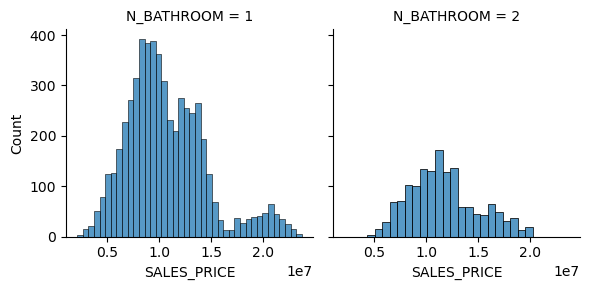

In [309]:
g = sns.FacetGrid(data=home_price, col='N_BATHROOM')
g.map(sns.histplot, 'SALES_PRICE')

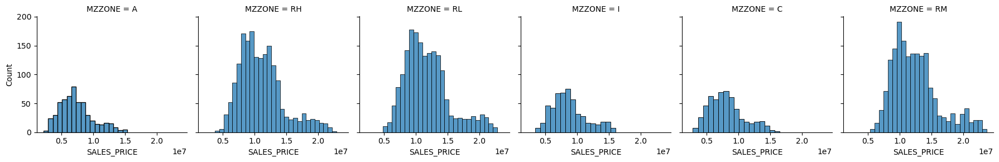

In [310]:
g = sns.FacetGrid(data=home_price, col='MZZONE')
g.map(sns.histplot, 'SALES_PRICE')

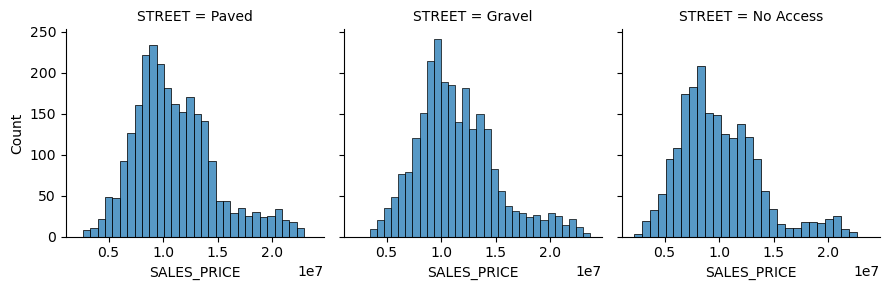

In [311]:
g = sns.FacetGrid(data=home_price, col='STREET')
g.map(sns.histplot, 'SALES_PRICE')

<Axes: xlabel='SALES_PRICE', ylabel='Density'>

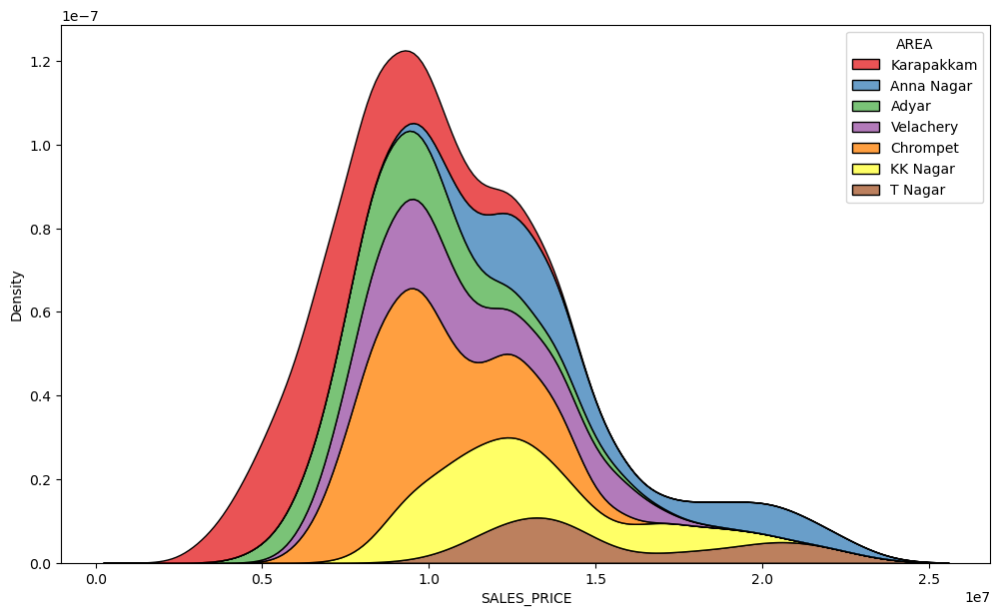

In [312]:
plt.figure(figsize=(12,7))
sns.kdeplot(data=home_price, hue='AREA', x='SALES_PRICE', palette='Set1', multiple="stack")

<Axes: xlabel='SALES_PRICE', ylabel='Density'>

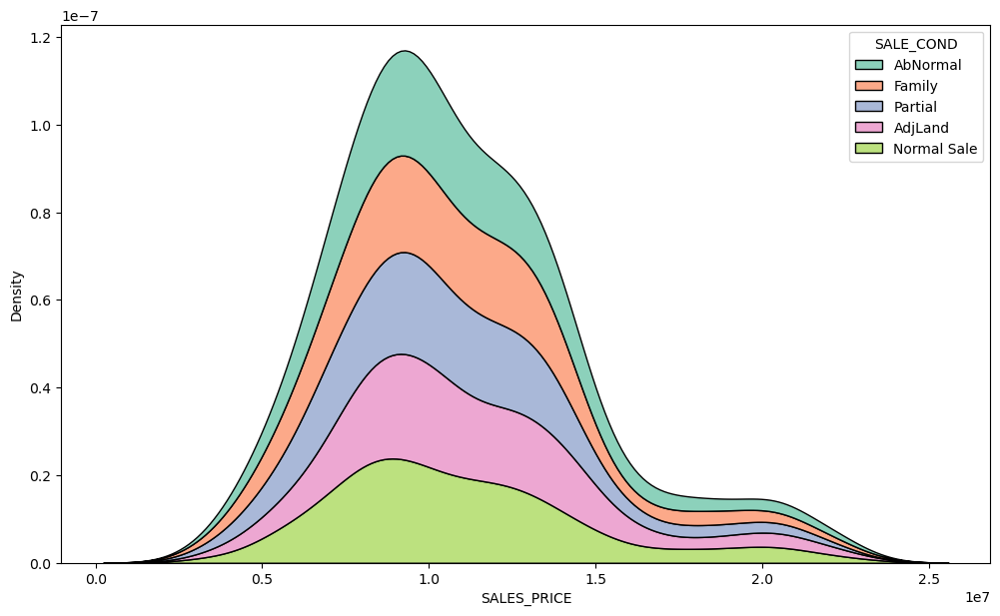

In [313]:
plt.figure(figsize=(12,7))
sns.kdeplot(data=home_price, hue='SALE_COND', x='SALES_PRICE', palette='Set2', multiple="stack")

<Axes: xlabel='SALES_PRICE', ylabel='Density'>

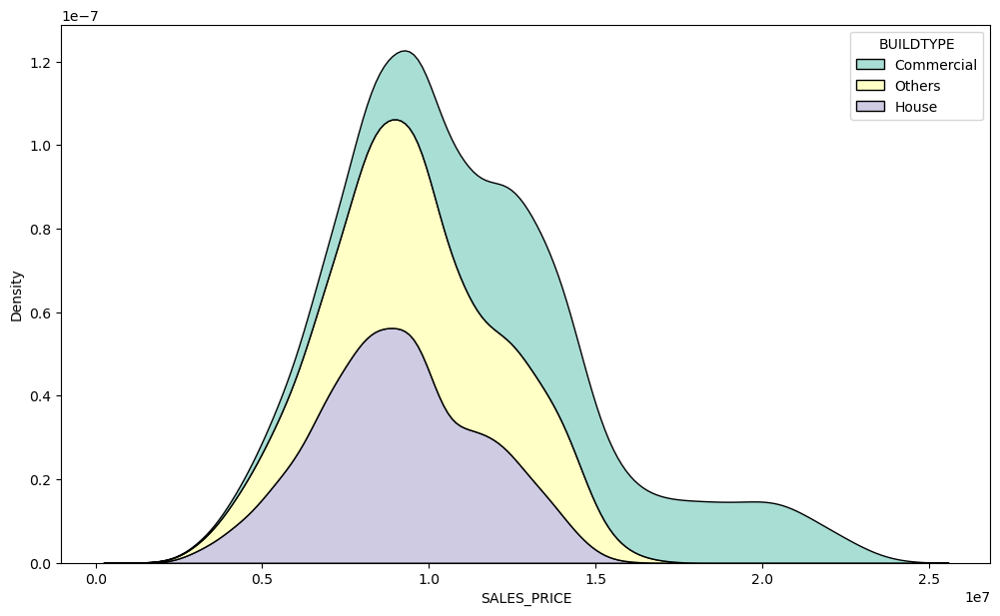

In [314]:
plt.figure(figsize=(12,7))
sns.kdeplot(data=home_price, hue='BUILDTYPE', x='SALES_PRICE', palette='Set3', multiple="stack")

<Figure size 1500x1000 with 0 Axes>

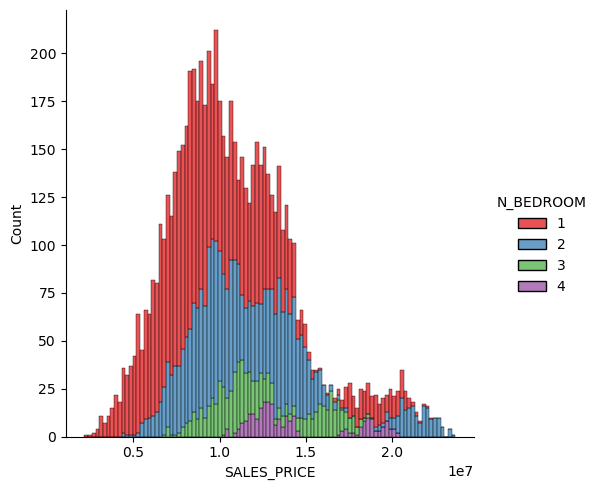

In [315]:
plt.figure(figsize=(15,10))
sns.displot(data=home_price, hue='N_BEDROOM', x='SALES_PRICE', palette='Set1', multiple="stack", bins=100)

<Figure size 1500x1000 with 0 Axes>

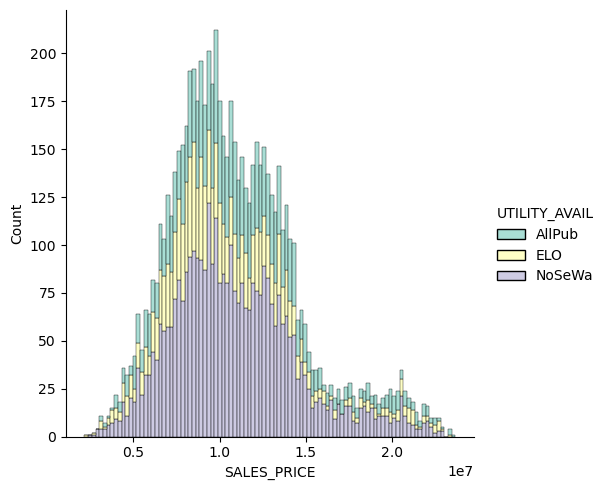

In [316]:
plt.figure(figsize=(15,10))
sns.displot(data=home_price, hue='UTILITY_AVAIL', x='SALES_PRICE', palette='Set3', multiple="stack", bins=100)

C:\Users\DELL\AppData\Local\Temp\ipykernel_2020\280326391.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='N_ROOM',data=home_price,palette='rainbow')


<Axes: xlabel='N_ROOM', ylabel='count'>

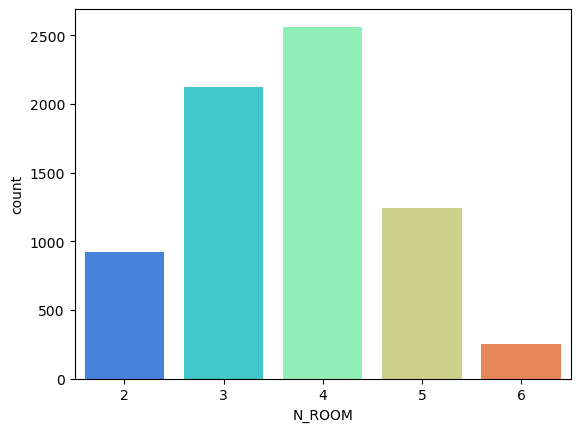

In [317]:
sns.countplot(x='N_ROOM',data=home_price,palette='rainbow')

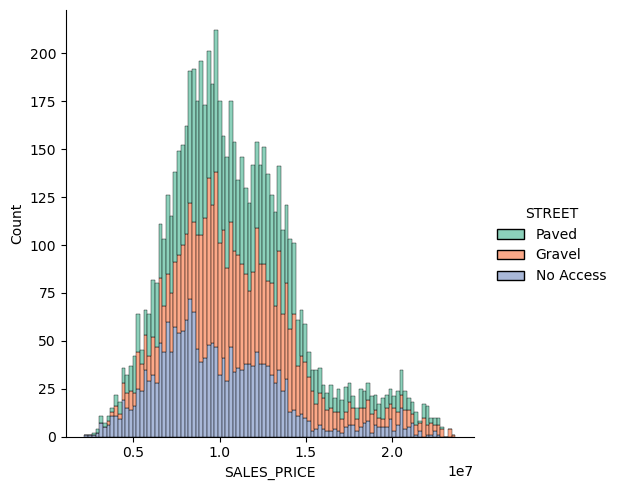

In [318]:
sns.displot(data=home_price, hue='STREET', x='SALES_PRICE', palette='Set2', multiple="stack", bins=100)

C:\Users\DELL\AppData\Local\Temp\ipykernel_2020\2883056810.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=home_price, x='N_ROOM', y='SALES_PRICE', palette='rainbow')


<Axes: xlabel='N_ROOM', ylabel='SALES_PRICE'>

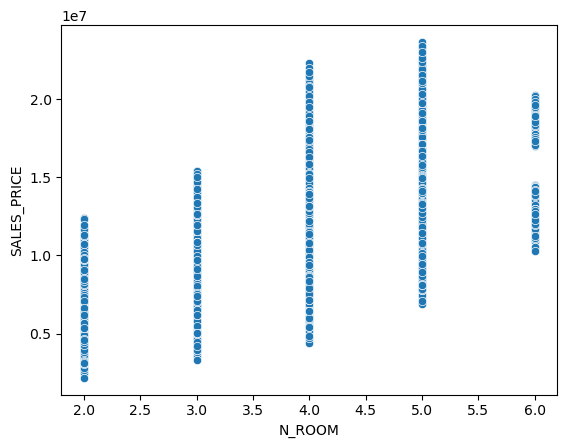

In [319]:
sns.scatterplot(data=home_price, x='N_ROOM', y='SALES_PRICE', palette='rainbow')

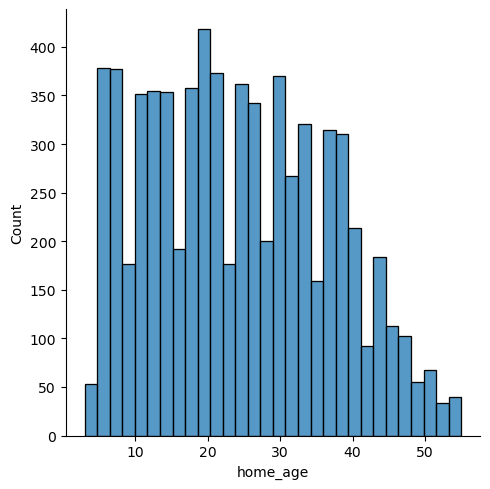

In [320]:
sns.displot(data=home_price, x='home_age', bins=30)

C:\Users\DELL\AppData\Local\Temp\ipykernel_2020\2758560841.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=home_price, x='SALES_PRICE', y='home_age', palette='rainbow')


<Axes: xlabel='SALES_PRICE', ylabel='home_age'>

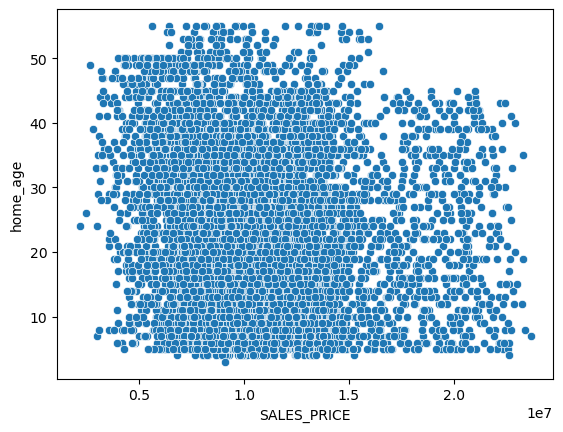

In [321]:
sns.scatterplot(data=home_price, x='SALES_PRICE', y='home_age', palette='rainbow')

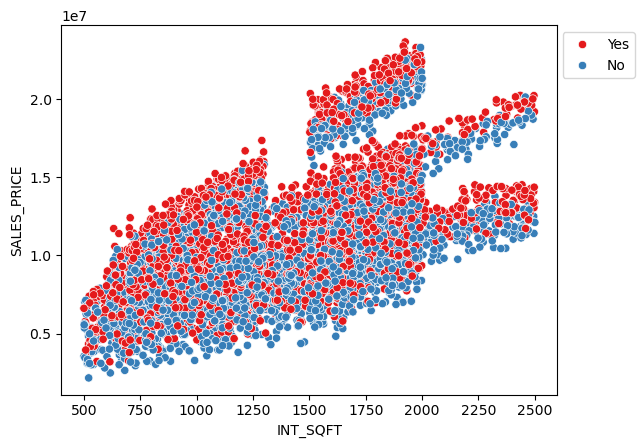

In [322]:
sns.scatterplot(data=home_price, x='INT_SQFT', y='SALES_PRICE', hue='PARK_FACIL',palette='Set1')
plt.legend(bbox_to_anchor=(1.17,1))

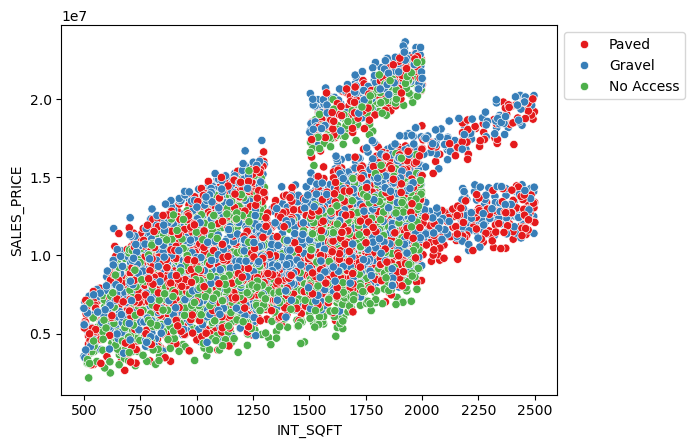

In [323]:
sns.scatterplot(data=home_price, x='INT_SQFT', y='SALES_PRICE', hue='STREET',palette='Set1')
plt.legend(bbox_to_anchor=(1,1))

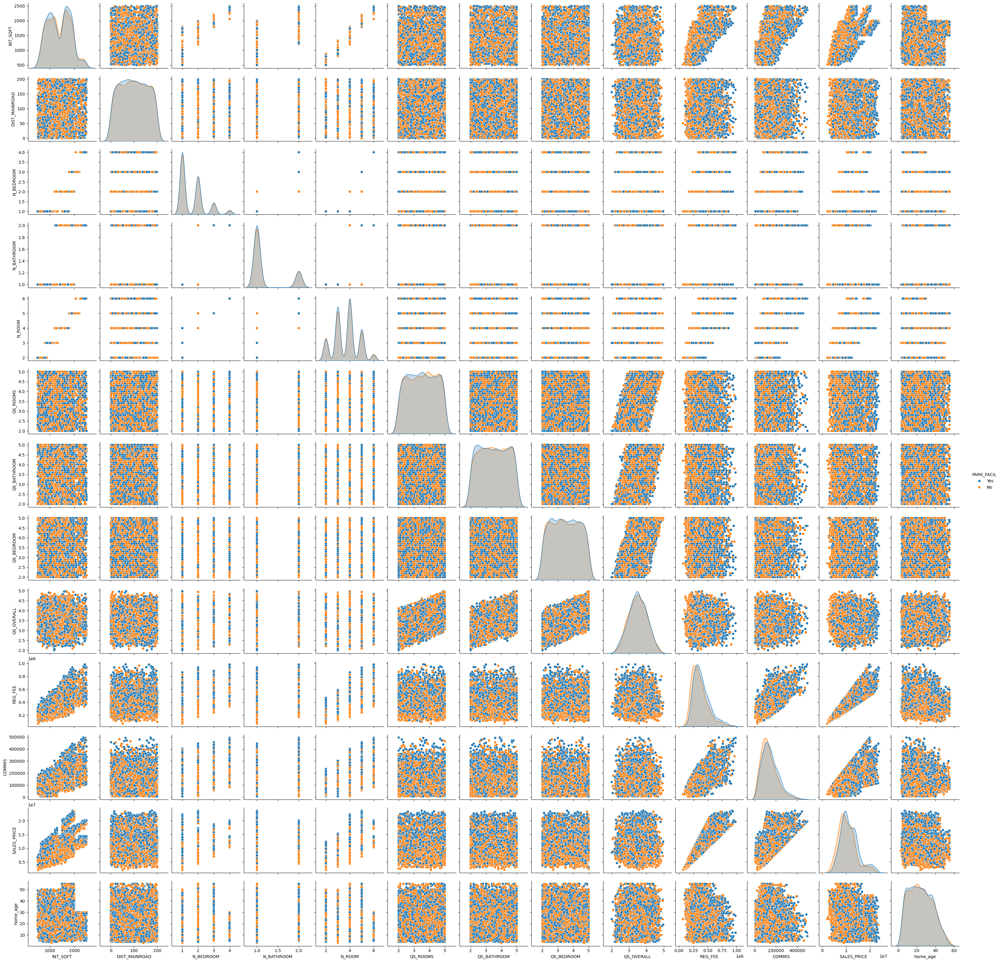

In [324]:
sns.pairplot(home_price, hue='PARK_FACIL')

## Preparing data for split

In [325]:
street = pd.get_dummies(home_price['STREET'],drop_first=True)
home_price = pd.concat([home_price,street], axis=1)

In [326]:
bld = pd.get_dummies(home_price['BUILDTYPE'],drop_first=True)
home_price = pd.concat([home_price,bld], axis=1)

In [327]:
mz = pd.get_dummies(home_price['MZZONE'],drop_first=True)
home_price = pd.concat([home_price,mz], axis=1)

In [328]:
sc = pd.get_dummies(home_price['SALE_COND'],drop_first=True)
home_price = pd.concat([home_price,sc], axis=1)

In [329]:
ar = pd.get_dummies(home_price['AREA'],drop_first=True)
home_price = pd.concat([home_price,ar], axis=1)

In [330]:
ua = pd.get_dummies(home_price['UTILITY_AVAIL'],drop_first=True)
home_price = pd.concat([home_price,ua], axis=1)

In [331]:
home_price.columns

Index(['PRT_ID', 'AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS',
       'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'REG_FEE', 'COMMIS',
       'SALES_PRICE', 'home_age', 'No Access', 'Paved', 'House', 'Others', 'C',
       'I', 'RH', 'RL', 'RM', 'AdjLand', 'Family', 'Normal Sale', 'Partial',
       'Anna Nagar', 'Chrompet', 'KK Nagar', 'Karapakkam', 'T Nagar',
       'Velachery', 'ELO', 'NoSeWa'],
      dtype='object')

In [332]:
home_price.head(1)

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,...,Normal Sale,Partial,Anna Nagar,Chrompet,KK Nagar,Karapakkam,T Nagar,Velachery,ELO,NoSeWa
0,P03210,Karapakkam,1004,4/5/2011,131,1,1,3,AbNormal,Yes,...,False,False,False,False,False,True,False,False,False,False


In [333]:
home_price['PARK_FACIL'] = [1 if x == 'Yes' else 0 for x in home_price['PARK_FACIL']]

In [334]:
home_price['PARK_FACIL'].value_counts()

PARK_FACIL
1    3587
0    3522
Name: count, dtype: int64

In [335]:
X = home_price.drop(['PRT_ID', 'AREA', 'DATE_SALE', 'SALE_COND', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE',
       'SALES_PRICE'], axis=1)
y = home_price['SALES_PRICE']

In [336]:
X.head(1)

,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,PARK_FACIL,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,...,Normal Sale,Partial,Anna Nagar,Chrompet,KK Nagar,Karapakkam,T Nagar,Velachery,ELO,NoSeWa
0,1004,131,1,1,3,1,4.0,3.9,4.9,4.33,...,False,False,False,False,False,True,False,False,False,False


## train_test_split

In [337]:
from sklearn.model_selection import train_test_split

In [338]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=45)

In [339]:
from sklearn.linear_model import LinearRegression

In [340]:
lr = LinearRegression()

## train model

In [341]:
lr.fit(X_train, y_train)

LinearRegression()

In [342]:
# Finding the percentage of impact of values ​​on the target
sorted(zip(lr.coef_,X.columns),reverse=True)

[(2286514.410181261, 'RM'),
 (1797734.7211740725, 'RL'),
 (1580982.0327902397, 'T Nagar'),
 (1485264.9630264991, 'Anna Nagar'),
 (1331604.6440879365, 'RH'),
 (904934.2297553921, 'I'),
 (780630.2919534874, 'PARK_FACIL'),
 (384838.82005580654, 'C'),
 (289368.53807584284, 'AdjLand'),
 (273668.9499863803, 'QS_OVERALL'),
 (188018.5001055455, 'N_BEDROOM'),
 (159071.97216483357, 'N_ROOM'),
 (18362.612860559293, 'Normal Sale'),
 (2938.731337173991, 'INT_SQFT'),
 (56.29152027449297, 'DIST_MAINROAD'),
 (5.63065741697914, 'REG_FEE'),
 (1.5699878496467106, 'COMMIS'),
 (-16218.670394246468, 'home_age'),
 (-36715.46069153815, 'Chrompet'),
 (-64565.89720304557, 'QS_ROOMS'),
 (-77896.1315143938, 'QS_BEDROOM'),
 (-83721.9429939566, 'QS_BATHROOM'),
 (-126771.15053465565, 'Family'),
 (-171647.81629240196, 'NoSeWa'),
 (-242989.29309312906, 'ELO'),
 (-257005.9031877678, 'Partial'),
 (-334256.0619655991, 'N_BATHROOM'),
 (-410593.9649647041, 'Paved'),
 (-933341.9584861753, 'No Access'),
 (-1349516.673003724,

## test model

In [343]:
predict = lr.predict(X_test)

## Evaluation

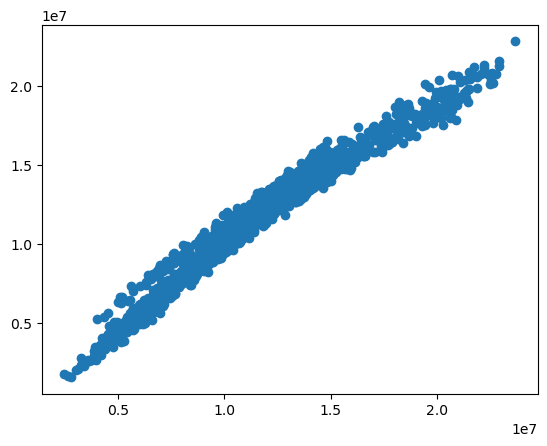

In [344]:
plt.scatter(y_test,predict)

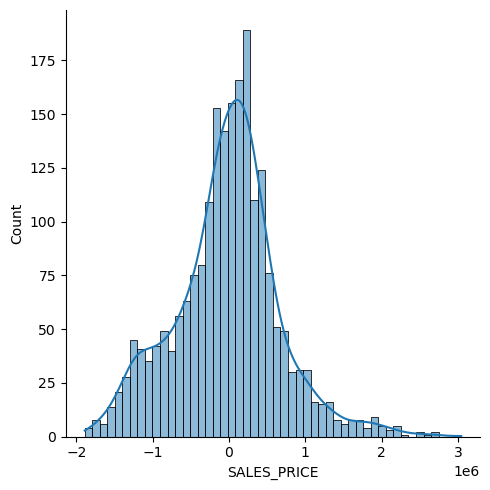

In [345]:
sns.displot((y_test-predict),bins=50, kde=True)

In [346]:
lr.score(X_test, y_test) * 100

96.62568813289539

In [347]:
from sklearn import metrics

In [351]:
print('MAE:', metrics.mean_absolute_error(y_test, predict))
print('MSE:', metrics.mean_squared_error(y_test, predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predict)))

MAE: 514284.16150958627
MSE: 475731044573.4171
RMSE: 689732.5891774413


# I achieved 96 percent in other words the error rate is 4 percent